In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os

from PIL import Image, ImageFilter

In [2]:
base_path = "C:\\Users\\johnn\\Desktop\\Repos\\Capstonfire"
fire_dataset_path = base_path + "\\FIRE Dataset"
forest_fire_dataset_path = base_path + "\\Forest Fire dataset"
wildfire_dataset_path = base_path + "\\the_wildfire_dataset"

# FIRE Dataset

Let's start by opening the folder and storing all files in a dataframe, for easier access in the future

How is the folder structured?

In [114]:
os.listdir(fire_dataset_path)

['fire_images', 'non_fire_images']

In [115]:
os.listdir(fire_dataset_path + "\\fire_images")

['fire.1.png',
 'fire.10.png',
 'fire.100.png',
 'fire.101.png',
 'fire.102.png',
 'fire.103.png',
 'fire.104.png',
 'fire.105.png',
 'fire.106.png',
 'fire.107.png',
 'fire.108.png',
 'fire.109.png',
 'fire.11.png',
 'fire.110.png',
 'fire.111.png',
 'fire.112.png',
 'fire.113.png',
 'fire.114.png',
 'fire.115.png',
 'fire.116.png',
 'fire.117.png',
 'fire.118.png',
 'fire.119.png',
 'fire.12.png',
 'fire.120.png',
 'fire.121.png',
 'fire.122.png',
 'fire.123.png',
 'fire.124.png',
 'fire.125.png',
 'fire.126.png',
 'fire.127.png',
 'fire.128.png',
 'fire.129.png',
 'fire.13.png',
 'fire.130.png',
 'fire.131.png',
 'fire.132.png',
 'fire.133.png',
 'fire.134.png',
 'fire.135.png',
 'fire.136.png',
 'fire.137.png',
 'fire.138.png',
 'fire.139.png',
 'fire.14.png',
 'fire.140.png',
 'fire.141.png',
 'fire.142.png',
 'fire.143.png',
 'fire.144.png',
 'fire.145.png',
 'fire.146.png',
 'fire.147.png',
 'fire.148.png',
 'fire.149.png',
 'fire.15.png',
 'fire.150.png',
 'fire.151.png',
 'fir

In [116]:
os.listdir(fire_dataset_path + "\\non_fire_images")

['non_fire.1.png',
 'non_fire.10.png',
 'non_fire.100.png',
 'non_fire.101.png',
 'non_fire.102.png',
 'non_fire.103.png',
 'non_fire.104.png',
 'non_fire.105.png',
 'non_fire.106.png',
 'non_fire.107.png',
 'non_fire.108.png',
 'non_fire.109.png',
 'non_fire.11.png',
 'non_fire.110.png',
 'non_fire.111.png',
 'non_fire.112.png',
 'non_fire.113.png',
 'non_fire.114.png',
 'non_fire.115.png',
 'non_fire.116.png',
 'non_fire.117.png',
 'non_fire.118.png',
 'non_fire.119.png',
 'non_fire.12.png',
 'non_fire.120.png',
 'non_fire.121.png',
 'non_fire.122.png',
 'non_fire.123.png',
 'non_fire.124.png',
 'non_fire.125.png',
 'non_fire.126.png',
 'non_fire.127.png',
 'non_fire.128.png',
 'non_fire.129.png',
 'non_fire.13.png',
 'non_fire.130.png',
 'non_fire.131.png',
 'non_fire.132.png',
 'non_fire.133.png',
 'non_fire.134.png',
 'non_fire.135.png',
 'non_fire.136.png',
 'non_fire.137.png',
 'non_fire.138.png',
 'non_fire.139.png',
 'non_fire.14.png',
 'non_fire.140.png',
 'non_fire.141.png',

Looks the dataset is split into two folders, "fire_images" and "non_fire_images"

Let us continue and store all image paths in a dataframe with the respective label.

In [74]:
#create an empty DataFrame
df_fire = pd.DataFrame(columns=['path','label'])

#loop over fire images and label them 1
for dirname, _, filenames in os.walk(fire_dataset_path + '\\fire_images'):
    for filename in filenames:
        #print(os.path.join(dirname, filename))
        df_fire = pd.concat([df_fire, pd.DataFrame([[os.path.join(dirname, filename),'fire']],columns=['path','label'])], axis=0)

#loop over non fire images and label them 0
for dirname, _, filenames in os.walk(fire_dataset_path + '\\non_fire_images'):
    for filename in filenames:
        df_fire = pd.concat([df_fire, pd.DataFrame([[os.path.join(dirname, filename),'non_fire']],columns=['path','label'])], axis=0)
        #print(os.path.join(dirname, filename))

#shuffle the dataset to redistribute the labels
df_fire = df_fire.sample(frac=1).reset_index(drop=True)
df_fire.head(10)

,path,label
0,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
1,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
2,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
3,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
4,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
5,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
6,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,non_fire
7,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire
8,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,non_fire
9,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire


In [75]:
len(df_fire.index)

999

1000 - 1 images, not much. How are the labels distributed along the dataframe?

In [76]:
fig = px.scatter(data_frame = df_fire,x=df_fire.index,y='label',color='label',title='Distribution of fire and non-fire images along the length of the dataframe')
fig.update_traces(marker_size=2)

Looks like there are more fire images than non fire images. Is this true?

In [110]:
fire_images = df_fire[df_fire['label'] == 'fire']
len(fire_images.index)

755

In [111]:
nonfire_images = df_fire[df_fire['label'] == 'non_fire']
len(nonfire_images.index)

244

In [77]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, {"type": "pie"}]])


fig.add_trace(go.Bar(x =df_fire['label'].value_counts().index,y=df_fire['label'].value_counts().to_numpy(),marker_color=['darkorange','green'],showlegend=False),row=1,col=1)

fig.add_trace(go.Pie(
     values=df_fire['label'].value_counts().to_numpy(),
     labels=df_fire['label'].value_counts().index,
    marker=dict(colors=['darkorange','green'])),
    row=1, col=2)

Checks out. Looks like the dataset is imbalanced.

What do the fire images look like?

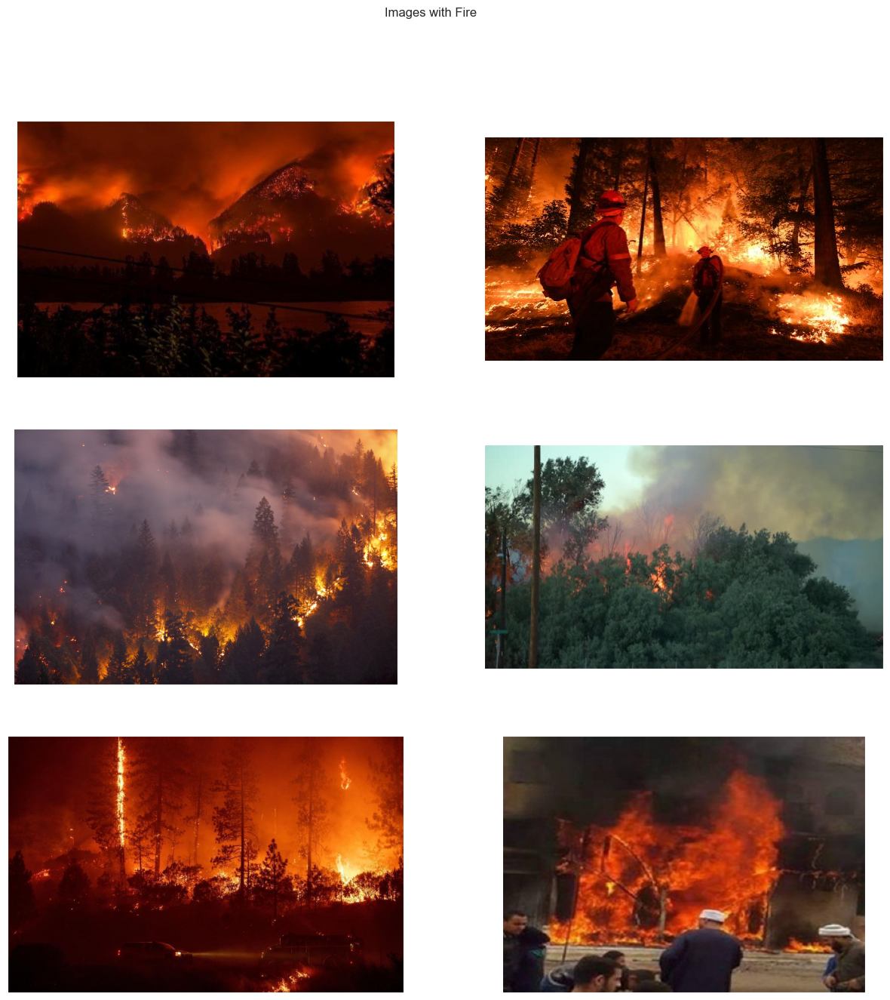

In [78]:
label = 'fire' #label for images with fire
data = df_fire[df_fire['label'] == label]
sns.set_style('dark')


pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images with Fire')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = data.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

Looks like they have two main componentes: fire and smoke. They are also mostly forest fire images, but not restricted to forest fires.

What about the non-fire images?

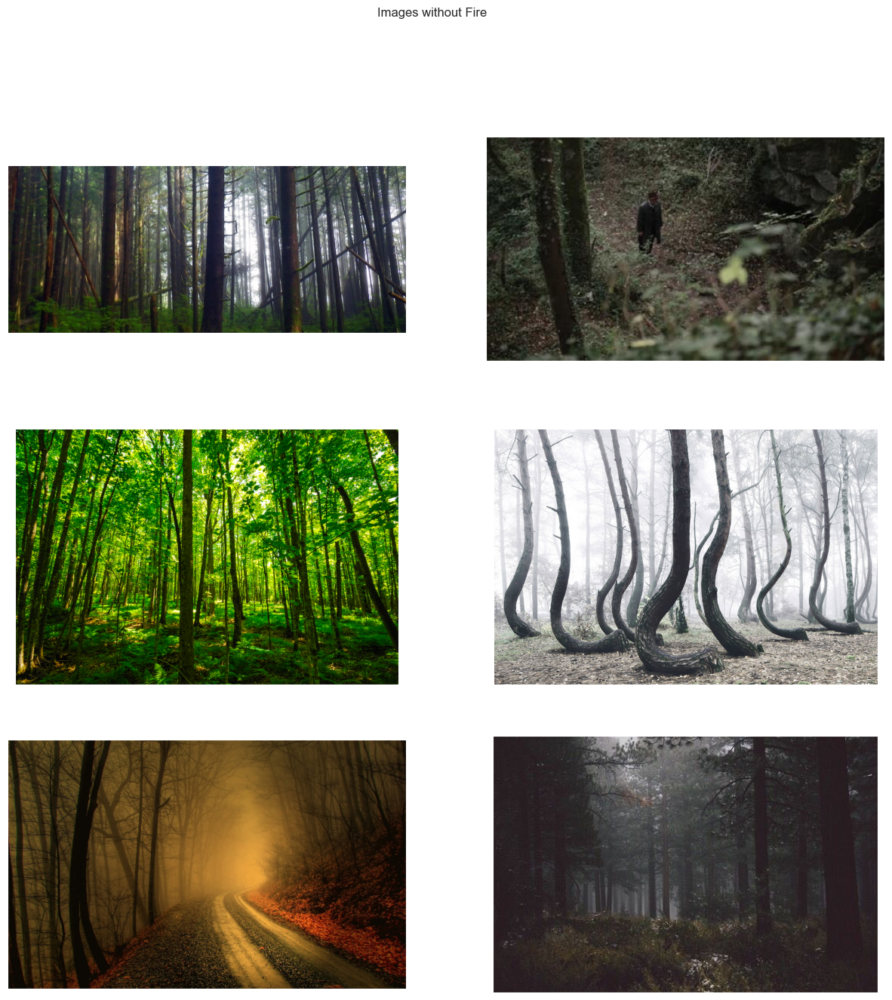

In [79]:
label = 'non_fire' #label for images without fire
data = df_fire[df_fire['label'] == label]
sns.set_style('dark')


pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images without Fire')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = data.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

Mainly forests that are not on fire.

Let's now check the size distribution of the images.

In [112]:
def shaper(row):
    shape = Image.open(row['path']).size
    row['height'] = shape[1]
    row['width'] = shape[0]
    return row
df_fire = df_fire.apply(shaper,axis=1)
df_fire.head(5)

,path,label,height,width
0,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,2048,1536
1,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,365,648
2,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,366,650
3,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,367,385
4,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,1368,2048


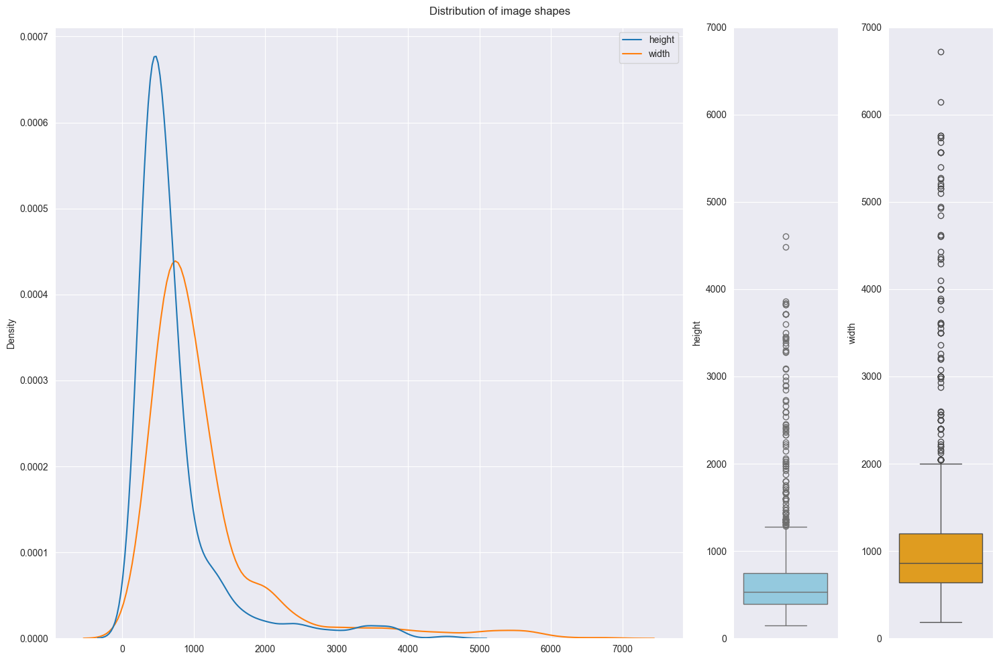

In [113]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df_fire.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=df_fire,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df_fire,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,7000)
ax2.set_ylim(0,7000)
plt.tight_layout()

Quite wide. Looks like images are either big or small, with a higher proportion of smaller images.

Let's do the same analysis for the Forest Fire dataset

# Forest Fire dataset

In [ ]:
# incoming

And now for the Wildfire dataset

# Wildfire Dataset

What is the structure?

In [126]:
dirs = os.listdir(wildfire_dataset_path)
dirs

['test', 'train', 'val']

In [127]:
for dir in dirs:
    print(os.listdir(wildfire_dataset_path + "\\" + dir))

['fire', 'nofire']
['fire', 'nofire']
['fire', 'nofire']


In [128]:
for dir in dirs:
    print(os.listdir(wildfire_dataset_path + "\\" + dir + "\\fire"))
    print(os.listdir(wildfire_dataset_path + "\\" + dir + "\\nofire"))

['Both_smoke_and_fire', 'Smoke_from_fires']
['Fire_confounding_elements', 'Forested_areas_without_confounding_elements', 'Smoke_confounding_elements']
['Both_smoke_and_fire', 'Smoke_from_fires']
['Fire_confounding_elements', 'Forested_areas_without_confounding_elements', 'Smoke_confounding_elements']
['Both_smoke_and_fire', 'Smoke_from_fires']
['Fire_confounding_elements', 'Forested_areas_without_confounding_elements', 'Smoke_confounding_elements']


Looks like this structure is different: unlike the previous two datasets where the main path had multiple folders, each with the images, this dataset has further directories:

    the_wildfire_dataset
    |-- train/val/test
        |-- fire
            |-- Both_smoke_and_fire
            |-- Smoke_from_fires
        |-- nofire
            |-- Fire_confounding_elements
            |-- Forested_areas_without_confounding_elements
            |-- Smoke_confounding_elements

However, the same strategy can be used with os.walk, since "filenames" will already consider the children directories. We just need to iterate over the 3 parent directories first.

In [129]:
#create an empty DataFrame
df_wildfire = pd.DataFrame(columns=['path','label'])

for dir in dirs:
    #loop over fire images and label them 1
    for dirname, _, filenames in os.walk(wildfire_dataset_path + "\\" + dir + '\\fire'):
        for filename in filenames:
            #print(os.path.join(dirname, filename))
            df_wildfire = pd.concat([df_wildfire, pd.DataFrame([[os.path.join(dirname, filename),'fire']],columns=['path','label'])], axis=0)

    #loop over non fire images and label them 0
    for dirname, _, filenames in os.walk(wildfire_dataset_path + "\\" + dir + '\\nofire'):
        for filename in filenames:
            df_wildfire = pd.concat([df_wildfire, pd.DataFrame([[os.path.join(dirname, filename),'no fire']],columns=['path','label'])], axis=0)
            #print(os.path.join(dirname, filename))

#shuffle the dataset to redistribute the labels
df_wildfire = df_wildfire.sample(frac=1).reset_index(drop=True)
df_wildfire.head(10)

,path,label
0,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
1,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
2,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,fire
3,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
4,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,fire
5,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
6,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
7,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,fire
8,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,no fire
9,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,fire


In [130]:
len(df_wildfire.index)

2700

Has some images. What is the label distribution?

In [131]:
fig = px.scatter(data_frame = df_wildfire,x=df_wildfire.index,y='label',color='label',title='Distribution of fire and non-fire images along the length of the dataframe')
fig.update_traces(marker_size=2)

In [132]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, {"type": "pie"}]])

fig.add_trace(go.Bar(x =df_wildfire['label'].value_counts().index,y=df_wildfire['label'].value_counts().to_numpy(),marker_color=['darkorange','green'],showlegend=False),row=1,col=1)

fig.add_trace(go.Pie(
     values=df_wildfire['label'].value_counts().to_numpy(),
     labels=df_wildfire['label'].value_counts().index,
    marker=dict(colors=['darkorange','green'])),
    row=1, col=2)

Inbalanced, but towards non fire images.

What do the images look like?

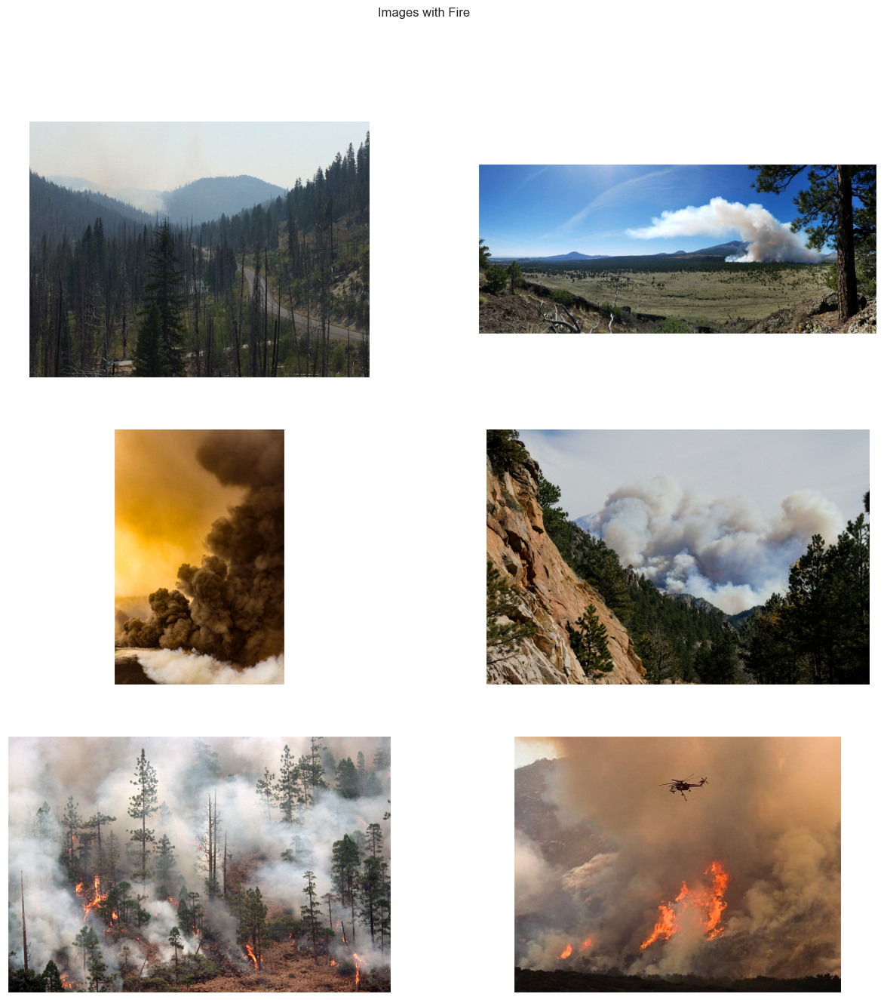

In [134]:
fire_label = 'fire' #label for images with fire
fire_data = df_wildfire[df_wildfire['label'] == fire_label]
sns.set_style('dark')


pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images with Fire')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = fire_data.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

Just as the child directories say: fire with smoke and only fire. The images are apparently also mostly in forested areas.

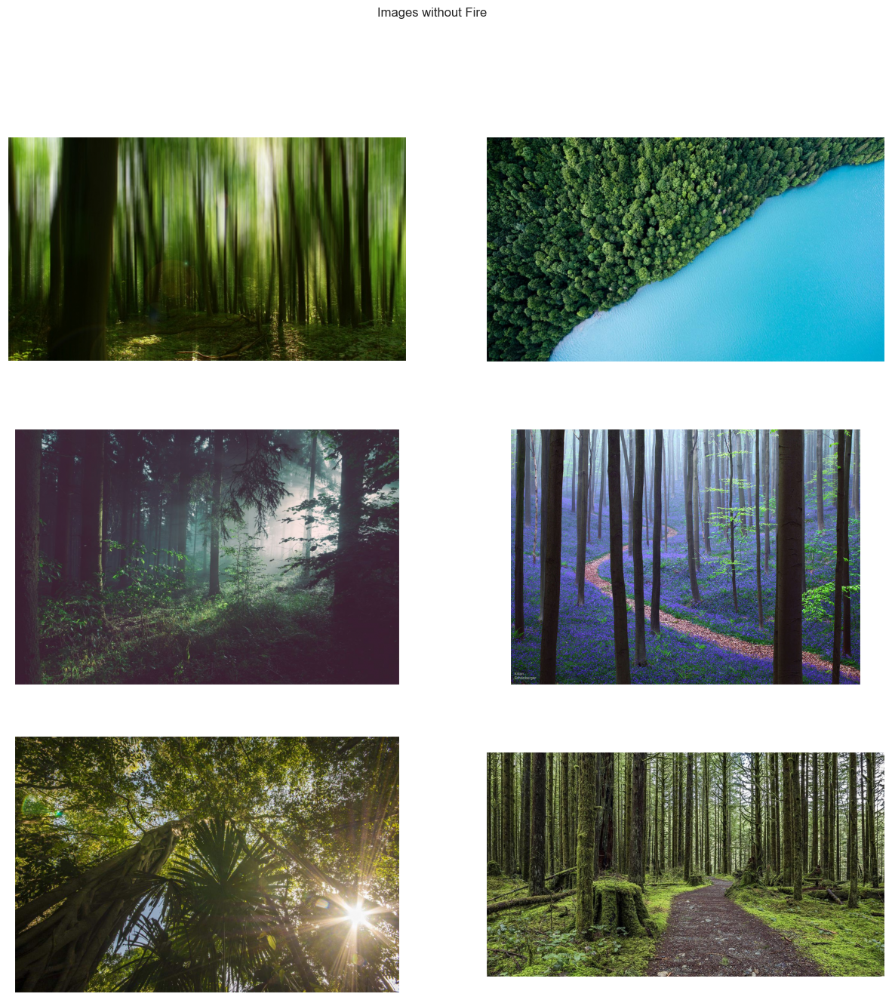

In [135]:
non_fire_label = 'no fire' #label for images without fire
non_fire_data = df_wildfire[df_wildfire['label'] == non_fire_label]
sns.set_style('dark')


pics = 6 #set the number of pics
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Images without Fire')
ax = ax.ravel()
for i in range((pics//2)*2):
    path = data.sample(1).loc[:,'path'].to_numpy()[0]
    img = Image.open(path)
    img = np.array(img) / 255.0
    ax[i].imshow(img)
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

Mainly clean forested areas.

What is the size distribution?

In [10]:
def shaper(row):
    image_path = row['path']

     # Check if the file is a valid image file
    if os.path.isfile(image_path) and image_path.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
        shape = Image.open(image_path).size
        row['height'] = shape[1]
        row['width'] = shape[0]

    return row

df_wildfire = df_wildfire.apply(shaper,axis=1)
df_wildfire.head(5)

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (101859328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (96631920 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (104688771 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (94487082 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionB

,height,label,path,width
0,716.0,fire,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,1280.0
1,2448.0,fire,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,3264.0
2,2437.0,no fire,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,4608.0
3,5678.0,no fire,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,3785.0
4,2667.0,no fire,C:\Users\johnn\Desktop\Repos\Capstonfire\the_w...,4000.0


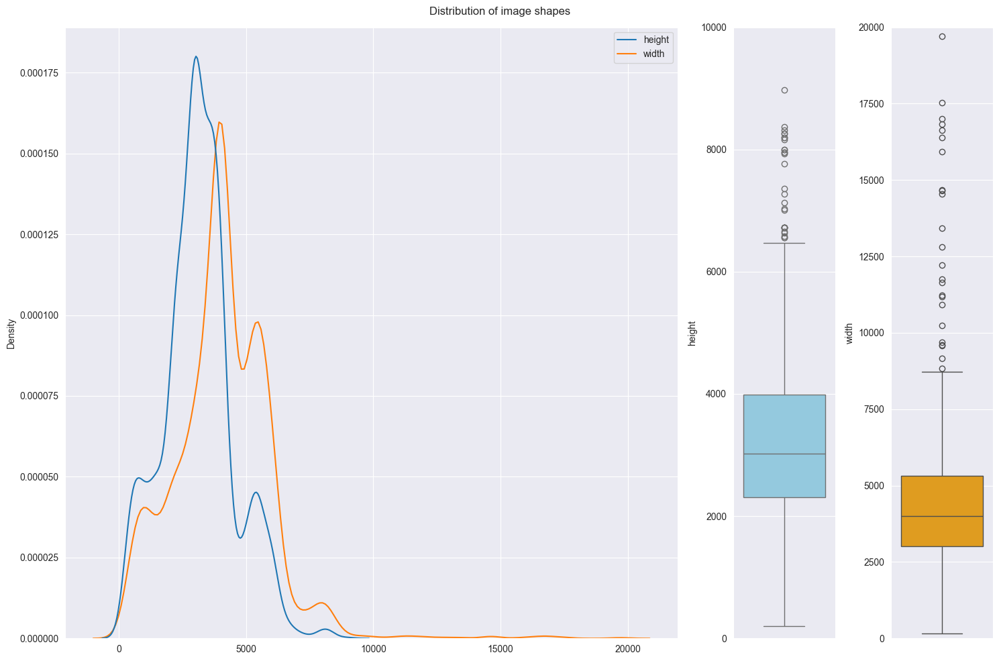

In [11]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df_wildfire.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=df_wildfire,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df_wildfire,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,20000)
ax2.set_ylim(0,10000)
plt.tight_layout()

There are some really big files, might make sense to compress dataset images to save space and avoid overburdening the hardware during training as much.

We will use the Python Image Library (PIL) for this

In [36]:
def resize_and_compress(input_path, output_path, new_size=(300, 300), quality=85):
    # Open the image file
    with Image.open(input_path) as img:
        # Resize the image
        resized_img = img.resize(new_size)

        # Save the resized and compressed image
        resized_img.save(output_path, quality=quality)

We will also split the images to two folders only: "fire_images" and "non_fire_images", to keep the structure consistent with the FIRE Dataset

In [13]:
new_path = base_path + "\\wildfire_dataset_2"

new_fire_path = new_path + "\\fire_images"
new_non_fire_path = new_path + "\\non_fire_images"

In [24]:
fire_label = 'fire' #label for images without fire
fire_data = df_wildfire[df_wildfire['label'] == fire_label]

In [25]:
non_fire_label = 'no fire' #label for images without fire
non_fire_data = df_wildfire[df_wildfire['label'] == non_fire_label]

In [17]:
df_wildfire.dtypes

height    float64
label      object
path       object
width     float64
dtype: object

We will try to keep the size at 480px on one dimension, since the algorithm will not receive images larger than that

For that, we first need to find the smallest dimension of the image, divide it by 480 and apply the same ratio to the other dimension

In [61]:
def resize_all_files(df: pd.DataFrame, path):
    for index, row in df.iterrows():
        if os.path.isfile(row['path']) and not row['path'].lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
            continue
        
        print(f"Index: {index}, width : {row['width']}, height: {row['height']}, label: {row['label']}, path: {row['path']}")
        if row['width'] > row['height']:
            ratio = row['height'] / 480
            resize_and_compress(row['path'], 
                                path + "\\" + str(index) + row['path'][-5:], # might get more than just the file format, but not important
                                (int(row['width']/ratio), 480) if row['height'] > 480 else (row['width'], row['height']), # get the correct height by dividing it by the ratio
                                quality= 100) #try to keep the most quality possible
        else:
            ratio = row['width'] / 480
            resize_and_compress(row['path'], 
                                path + "\\" + str(index) + row['path'][-5:],
                                (480, int(row['height']/ratio)) if row['width'] > 480 else (row['width'], row['height']),
                                quality= 100)


In [49]:
resize_all_files(fire_data, new_fire_path)
resize_all_files(non_fire_data, new_non_fire_path)

Index: 0, width : 1280.0, height: 716.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\fire\Smoke_from_fires\52258839831_ac734240b5_o.jpg
Index: 1, width : 3264.0, height: 2448.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\fire\Smoke_from_fires\48579551262_b5963116c0_o.jpg
Index: 2, width : 4608.0, height: 2437.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Fire_confounding_elements\kym-mackinnon-31hELUX_Rk0-unsplash.jpg
Index: 3, width : 3785.0, height: 5678.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\val\nofire\Fire_confounding_elements\eberhard-grossgasteiger-YJsDlw9yHWs-unsplash.jpg
Index: 4, width : 4000.0, height: 2667.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Smoke_confounding_elements\linas-bam-q1X6ADPZl4w-unsplash.jpg
Index: 5, width : 2976.0

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (101859328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.



Index: 772, width : 6000.0, height: 4000.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Smoke_confounding_elements\benjamin-grull-lOONLlJvKI0-unsplash.jpg
Index: 773, width : 3640.0, height: 5464.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Forested_areas_without_confounding_elements\kristaps-ungurs-bqRUmr144Rc-unsplash.jpg
Index: 774, width : 2250.0, height: 4000.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Forested_areas_without_confounding_elements\olena-sergienko-1wYD3cqD83I-unsplash.jpg
Index: 775, width : 4016.0, height: 4934.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Smoke_confounding_elements\alan-labisch-DdjJ91eIFVc-unsplash.jpg
Index: 776, width : 4608.0, height: 2592.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (96631920 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.



Index: 1113, width : 1008.0, height: 756.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\fire\Smoke_from_fires\50409394257_d883b12e16_o.jpg
Index: 1114, width : 2337.0, height: 2921.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Smoke_confounding_elements\oliver-roos-fJTfWn5nNuk-unsplash.jpg
Index: 1115, width : 3024.0, height: 4032.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\fire\Smoke_from_fires\52466868808_c06d05c0a3_o.jpg
Index: 1116, width : 5184.0, height: 2592.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Forested_areas_without_confounding_elements\jens-aber-wJayMBspHVE-unsplash.jpg
Index: 1117, width : 2575.0, height: 3219.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\val\nofire\Forested_areas_without_confounding_elements\oliver-roos-4eu417cVNo4-

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (104688771 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.



Index: 1502, width : 5491.0, height: 3661.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Forested_areas_without_confounding_elements\nic-y-c-vNBg-a6eRtc-unsplash.jpg
Index: 1503, width : 1811.0, height: 1358.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\fire\Smoke_from_fires\34182404715_6454a87316_o.jpg
Index: 1504, width : 1440.0, height: 1920.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\test\nofire\Fire_confounding_elements\53078944067_43c7e3552a_o.jpg
Index: 1505, width : 3669.0, height: 2752.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Forested_areas_without_confounding_elements\aaron-burden-Qy-CBKUg_X8-unsplash.jpg
Index: 1506, width : 3557.0, height: 1879.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\fire\Smoke_from_fires\43705414030_90d1a37a1a_o

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (94487082 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.



Index: 2541, width : 5560.0, height: 3707.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\val\fire\Smoke_from_fires\dave-hoefler-nyhI63n7vpQ-unsplash.jpg
Index: 2542, width : 5356.0, height: 3588.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\test\fire\Both_smoke_and_fire\35531872313_eb8772df72_o.jpg
Index: 2543, width : 3500.0, height: 2308.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Fire_confounding_elements\chad-mcmillan-R4T9TI8EsJI-unsplash.jpg
Index: 2544, width : 5360.0, height: 3580.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\fire\Smoke_from_fires\35531863303_6e619eba6b_o.jpg
Index: 2545, width : 2602.0, height: 3469.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Forested_areas_without_confounding_elements\kristaps-ungurs-1q54ClpzDBE-unsplash.jpg
Index: 2

c:\Users\johnn\AppData\Local\Programs\Python\Python311\Lib\site-packages\PIL\Image.py:3182: DecompressionBombWarning:

Image size (89747104 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.



Index: 2608, width : 4373.0, height: 3376.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\fire\Both_smoke_and_fire\43825007480_381db74ae8_o.jpg
Index: 2609, width : 4000.0, height: 3000.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\nofire\Forested_areas_without_confounding_elements\annie-spratt-osXoC977Cx0-unsplash.jpg
Index: 2610, width : 3719.0, height: 4649.0, label: no fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\test\nofire\Forested_areas_without_confounding_elements\hunter-bryant-C0bPTsZnoH8-unsplash.jpg
Index: 2611, width : 5360.0, height: 3584.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\train\fire\Both_smoke_and_fire\36296147916_c7385539eb_o.jpg
Index: 2612, width : 3000.0, height: 2808.0, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\the_wildfire_dataset\test\fire\Both_smoke_and_fire\50229336772_7f5719786b_o

Let's check if it worked

In [53]:
new_df_wildfire = pd.DataFrame(columns=['path', 'label', 'width', 'height'])

for dirname, _, filenames in os.walk(new_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        new_df_wildfire = pd.concat([new_df_wildfire, pd.DataFrame([[os.path.join(dirname, filename),'fire', width, height]], columns=['path','label', 'width', 'height'])], axis=0)

for dirname, _, filenames in os.walk(new_non_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        new_df_wildfire = pd.concat([new_df_wildfire, pd.DataFrame([[os.path.join(dirname, filename),'no fire', width, height]],columns=['path','label', 'width', 'height'])], axis=0)

new_df_wildfire = new_df_wildfire.sample(frac=1).reset_index(drop=True)
new_df_wildfire.head(10)

,path,label,width,height
0,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,480,720
1,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,fire,1032,480
2,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,720,480
3,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,719,480
4,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,640,480
5,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,720,480
6,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,480,599
7,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,fire,640,480
8,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,642,480
9,C:\Users\johnn\Desktop\Repos\Capstonfire\wildf...,no fire,720,480


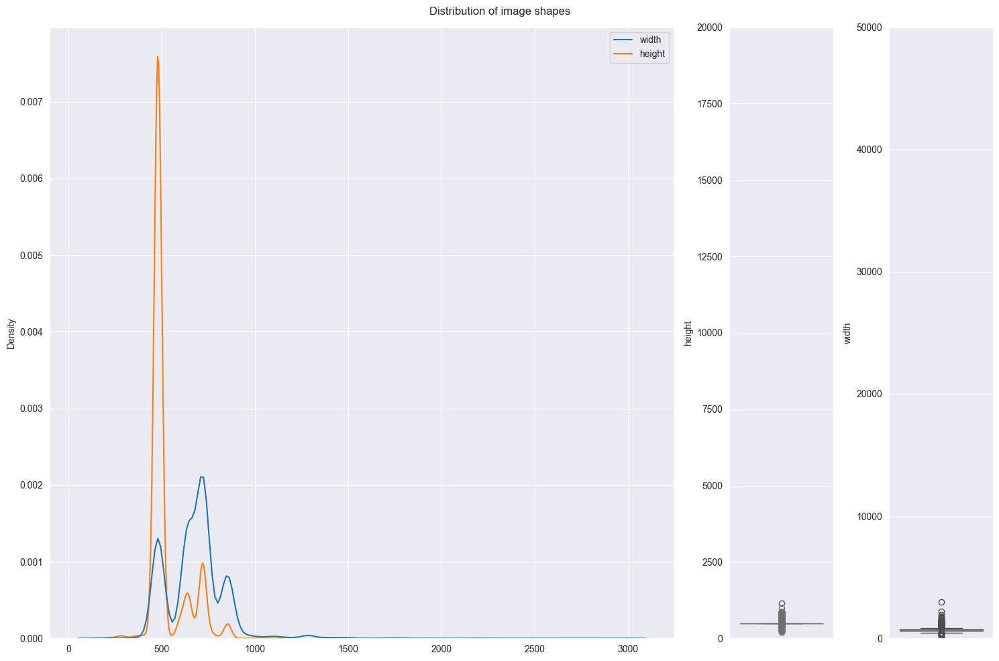

In [59]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=new_df_wildfire.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=new_df_wildfire,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=new_df_wildfire,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,50000)
ax2.set_ylim(0,20000)
plt.tight_layout()

Very good!

In [58]:
def get_folder_size(folder_path):
    total_size = 0

    for dirpath, dirnames, filenames in os.walk(folder_path):
        for filename in filenames:
            file_path = os.path.join(dirpath, filename)
            total_size += os.path.getsize(file_path)

    return total_size

def format_size(size):
    # Convert bytes to a human-readable format
    for unit in ['B', 'KB', 'MB', 'GB', 'TB']:
        if size < 1024.0:
            break
        size /= 1024.0
    return f"{size:.2f} {unit}"

total_size = get_folder_size(new_fire_path) + get_folder_size(new_non_fire_path)

print(f"Total size of '{new_path}': {format_size(total_size)}")

Total size of 'C:\Users\johnn\Desktop\Repos\Capstonfire\wildfire_dataset_2': 670.09 MB


We just saved 9.33 Gb of data

Let's do the same for the FIRE dataset

In [81]:
full_dataset_path = base_path + "\\full_dataset_2"

full_dataset_fire_path = full_dataset_path + "\\fire_images"
full_dataset_non_fire_path = full_dataset_path + "\\non_fire_images"

In [82]:
fire_label = 'fire' #label for images without fire
fire_data = df_fire[df_fire['label'] == fire_label]

In [83]:
non_fire_label = 'non_fire' #label for images without fire
non_fire_data = df_fire[df_fire['label'] == non_fire_label]

In [84]:
fire_data.head()

,path,label,height,width
0,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,2048,1536
1,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,365,648
2,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,366,650
3,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,367,385
4,C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE ...,fire,1368,2048


In [85]:
resize_all_files(fire_data, full_dataset_fire_path)
resize_all_files(non_fire_data, full_dataset_non_fire_path)

Index: 0, width : 1536, height: 2048, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE Dataset\fire_images\fire.89.png
Index: 1, width : 648, height: 365, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE Dataset\fire_images\fire.297.png
Index: 2, width : 650, height: 366, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE Dataset\fire_images\fire.474.png
Index: 3, width : 385, height: 367, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE Dataset\fire_images\fire.110.png
Index: 4, width : 2048, height: 1368, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE Dataset\fire_images\fire.654.png
Index: 5, width : 780, height: 439, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE Dataset\fire_images\fire.675.png
Index: 7, width : 660, height: 280, label: fire, path: C:\Users\johnn\Desktop\Repos\Capstonfire\FIRE Dataset\fire_images\fire.518.png
Index: 9, width : 924, height: 616, label: fire, path: C:\U

In [86]:
new_df_fire = pd.DataFrame(columns=['path', 'label', 'width', 'height'])

for dirname, _, filenames in os.walk(full_dataset_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        new_df_fire = pd.concat([new_df_fire, pd.DataFrame([[os.path.join(dirname, filename),'fire', width, height]], columns=['path','label', 'width', 'height'])], axis=0)

for dirname, _, filenames in os.walk(full_dataset_non_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        new_df_fire = pd.concat([new_df_fire, pd.DataFrame([[os.path.join(dirname, filename),'no fire', width, height]],columns=['path','label', 'width', 'height'])], axis=0)

new_df_fire = new_df_fire.sample(frac=1).reset_index(drop=True)
new_df_fire.head(10)

,path,label,width,height
0,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,719,480
1,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,709,480
2,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,721,480
3,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,684,480
4,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,534,401
5,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,810,456
6,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,575,480
7,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,640,480
8,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,300,180
9,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,647,404


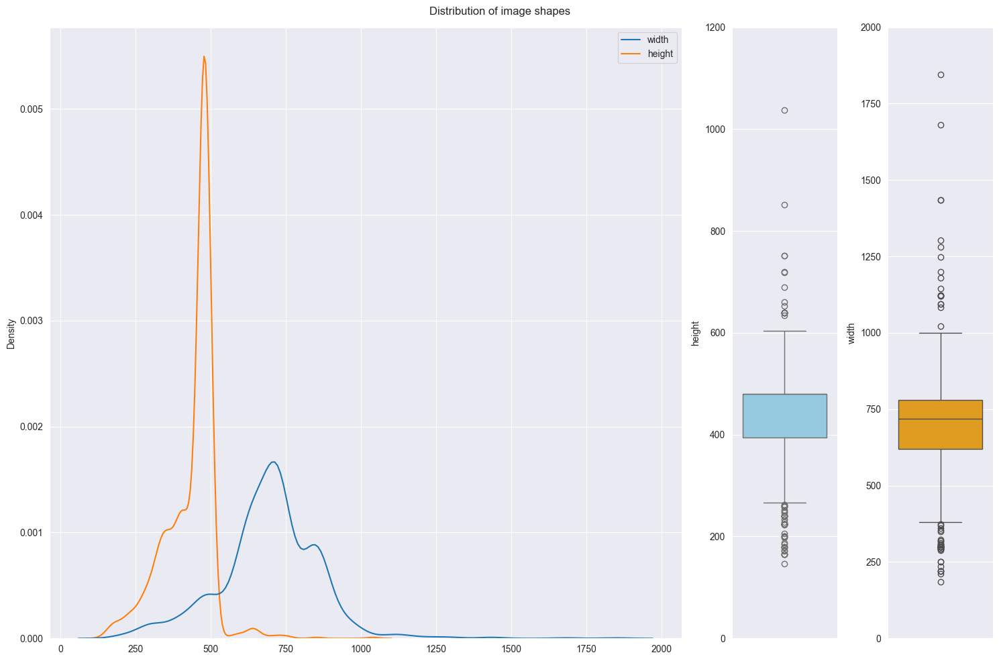

In [89]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=new_df_fire.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=new_df_fire,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=new_df_fire,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,2000)
ax2.set_ylim(0,1200)
plt.tight_layout()

And for the Forest Fire dataset as well

In [ ]:
# incoming

And to end let's move the files of the new wildfire dataset to the new full dataset

In [90]:
import shutil

In [ ]:
new_path = base_path + "\\wildfire_dataset_2"

new_fire_path = new_path + "\\fire_images"
new_non_fire_path = new_path + "\\non_fire_images"

In [ ]:
full_dataset_path = base_path + "\\full_dataset_2"

full_dataset_fire_path = full_dataset_path + "\\fire_images"
full_dataset_non_fire_path = full_dataset_path + "\\non_fire_images"

In [95]:
for filename in os.listdir(new_fire_path):
    shutil.move(new_fire_path + "\\" + filename, full_dataset_fire_path)

for filename in os.listdir(new_non_fire_path):
    shutil.move(new_non_fire_path + "\\" + filename, full_dataset_non_fire_path)

Let's now check the size of the full dataset

In [96]:
df_full = pd.DataFrame(columns=['path', 'label', 'width', 'height'])

for dirname, _, filenames in os.walk(full_dataset_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        df_full = pd.concat([df_full, pd.DataFrame([[os.path.join(dirname, filename),'fire', width, height]], columns=['path','label', 'width', 'height'])], axis=0)

for dirname, _, filenames in os.walk(full_dataset_non_fire_path):
    for filename in filenames:
        image_shape = Image.open(dirname + "\\" + filename).size
        height = image_shape[1]
        width = image_shape[0]
        df_full = pd.concat([df_full, pd.DataFrame([[os.path.join(dirname, filename),'no fire', width, height]],columns=['path','label', 'width', 'height'])], axis=0)

df_full = df_full.sample(frac=1).reset_index(drop=True)
df_full.head(10)

,path,label,width,height
0,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,620,465
1,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,480,853
2,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,689,480
3,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,735,480
4,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,709,480
5,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,717,480
6,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,no fire,640,480
7,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,620,349
8,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,634,434
9,C:\Users\johnn\Desktop\Repos\Capstonfire\full_...,fire,722,480


In [97]:
len(df_full.index)

3698

Nice, 999 + ... + 2699, matches

Let's check how the full dataset looks.

In [98]:
fig = px.scatter(data_frame = df_full,x=df_full.index,y='label',color='label',title='Distribution of fire and non-fire images along the length of the dataframe')
fig.update_traces(marker_size=2)

In [99]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, {"type": "pie"}]])

fig.add_trace(go.Bar(x =df_full['label'].value_counts().index,y=df_full['label'].value_counts().to_numpy(),marker_color=['darkorange','green'],showlegend=False),row=1,col=1)

fig.add_trace(go.Pie(
     values=df_full['label'].value_counts().to_numpy(),
     labels=df_full['label'].value_counts().index,
    marker=dict(colors=['darkorange','green'])),
    row=1, col=2)

In [103]:
full_fire_data = df_full[df_full['label'] == 'fire']
len(full_fire_data.index)

1800

In [102]:
full_non_fire_data = df_full[df_full['label'] == 'no fire']
len(full_non_fire_data.index)

1898

Nicely balanced.

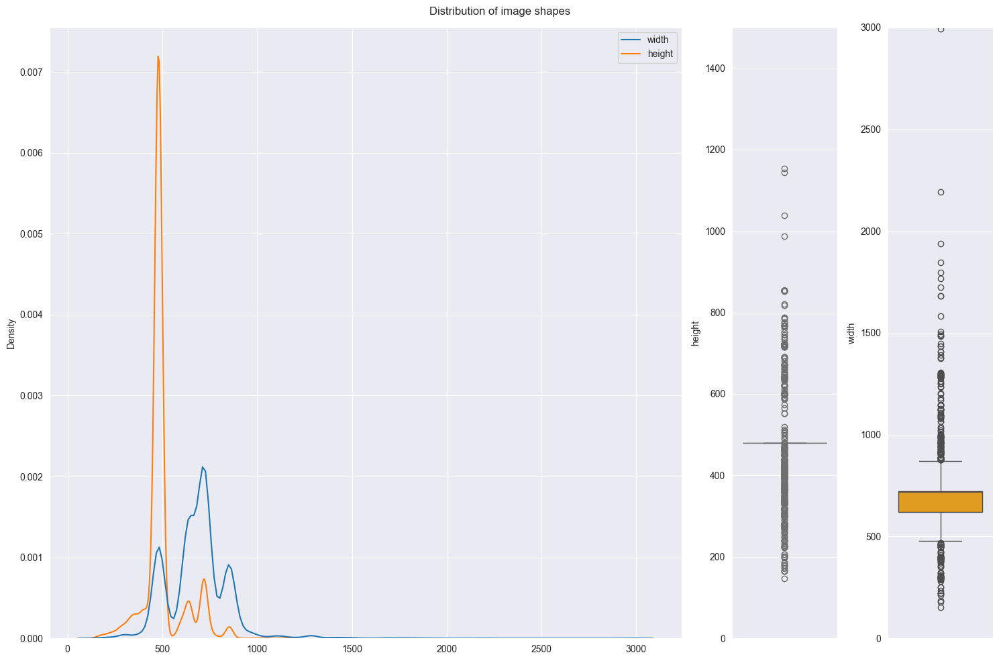

In [106]:
sns.set_style('darkgrid')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,gridspec_kw={'width_ratios': [3,0.5,0.5]},figsize=(15,10))
sns.kdeplot(data=df_full.drop(columns=['path','label']),ax=ax1,legend=True)
sns.boxplot(data=df_full,y='height',ax=ax2,color='skyblue')
sns.boxplot(data=df_full,y='width',ax=ax3,color='orange')
plt.suptitle('Distribution of image shapes')
ax3.set_ylim(0,3000)
ax2.set_ylim(0,1500)
plt.tight_layout()

And with image size distribution mirroring the resizing treatment we performed earlier.

We are now ready to start training models!